Import Necessary Libraries

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 903.1/903.1 kB 24.9 MB/s eta 0:00:00


Checking if Ultralytics is loaded properly

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.7/112.6 GB disk)


Load the YOLOv8 Model

In [ ]:
from ultralytics import YOLO
from IPython.display import Image

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="yGjNOQYDYbnOqpzTKa2R")
project = rf.workspace("tamannas-workspace").project("counting-honeybees")
version = project.version(4)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.2 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Counting-Honeybees-4 in yolov8:: 100%|██████████| 2424/2424 [00:00<00:00, 6712.26it/s]


In [ ]:
dataset_path = "/content/Counting-Honeybees-4"

In [ ]:
!yolo task=detect mode=train data='/content/Counting-Honeybees-4/data.yaml' model="yolov8s.pt" epochs=300 imgsz=640

100% 21.5M/21.5M [00:00<00:00, 151MB/s]
Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/Counting-Honeybees-4/data.yaml, epochs=300, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cr

In [ ]:
from ultralytics import YOLO

# Load your trained model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Validate the model on the validation dataset
results = model.val(data="/content/Counting-Honeybees-4/data.yaml", conf=0.25)

# Extract metrics
# Access precision values using the 'p' attribute directly on 'results.box'
precision = results.box.p.mean()  # Average precision across classes
recall = results.box.r.mean()        # Average recall across classes
map50 = results.box.map50                 # mAP@0.5
map50_95 = results.box.map                # mAP@0.5:0.95


# Print metrics in percentage format
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall (Accuracy): {recall * 100:.2f}%")
print(f"mAP@0.5: {map50 * 100:.2f}%")
print(f"mAP@0.5:0.95: {map50_95 * 100:.2f}%")

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/Counting-Honeybees-4/valid/labels.cache... 121 images, 14 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:06<00:00,  1.24it/s]


                   all        121       2085      0.669      0.642      0.638      0.254
Speed: 6.0ms preprocess, 11.0ms inference, 0.0ms loss, 7.4ms postprocess per image
Results saved to runs/detect/val
Precision: 66.93%
Recall (Accuracy): 64.17%
mAP@0.5: 63.81%
mAP@0.5:0.95: 25.41%


In [ ]:
!zip -r runs-yolo8-v9.zip runs

  adding: runs/ (stored 0%)
  adding: runs/detect/ (stored 0%)
  adding: runs/detect/train/ (stored 0%)
  adding: runs/detect/train/args.yaml (deflated 53%)
  adding: runs/detect/train/val_batch1_pred.jpg (deflated 9%)
  adding: runs/detect/train/labels_correlogram.jpg (deflated 34%)
  adding: runs/detect/train/PR_curve.png (deflated 18%)
  adding: runs/detect/train/results.csv (deflated 61%)
  adding: runs/detect/train/R_curve.png (deflated 18%)
  adding: runs/detect/train/train_batch1.jpg (deflated 5%)
  adding: runs/detect/train/labels.jpg (deflated 27%)
  adding: runs/detect/train/results.png (deflated 7%)
  adding: runs/detect/train/P_curve.png (deflated 16%)
  adding: runs/detect/train/weights/ (stored 0%)
  adding: runs/detect/train/weights/last.pt (deflated 8%)
  adding: runs/detect/train/weights/best.pt (deflated 8%)
  adding: runs/detect/train/val_batch0_labels.jpg (deflated 4%)
  adding: runs/detect/train/val_batch0_pred.jpg (deflated 4%)
  adding: runs/detect/train/train_ba

In [ ]:
!yolo task=detect mode=train data='/content/Counting-Honeybees-4/data.yaml' model="/content/runs/detect/train/weights/best.pt" epochs=300 imgsz=640

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/train/weights/best.pt, data=/content/Counting-Honeybees-4/data.yaml, epochs=300, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fals

In [ ]:
from ultralytics import YOLO

# Load your trained model
model = YOLO("/content/runs/detect/train2/weights/best.pt")

# Validate the model on the validation dataset
results = model.val(data="/content/Counting-Honeybees-4/data.yaml", conf=0.25)

# Extract metrics
# Access precision values using the 'p' attribute directly on 'results.box'
precision = results.box.p.mean()  # Average precision across classes
recall = results.box.r.mean()        # Average recall across classes
map50 = results.box.map50                 # mAP@0.5
map50_95 = results.box.map                # mAP@0.5:0.95


# Print metrics in percentage format
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall (Accuracy): {recall * 100:.2f}%")
print(f"mAP@0.5: {map50 * 100:.2f}%")
print(f"mAP@0.5:0.95: {map50_95 * 100:.2f}%")

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/Counting-Honeybees-4/valid/labels.cache... 121 images, 14 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:06<00:00,  1.21it/s]


                   all        121       2085      0.669      0.583      0.613      0.236
Speed: 9.6ms preprocess, 11.5ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to runs/detect/val2
Precision: 66.86%
Recall (Accuracy): 58.32%
mAP@0.5: 61.28%
mAP@0.5:0.95: 23.57%


In [ ]:
!zip -r retrain-runs-yolo8-v9.zip runs

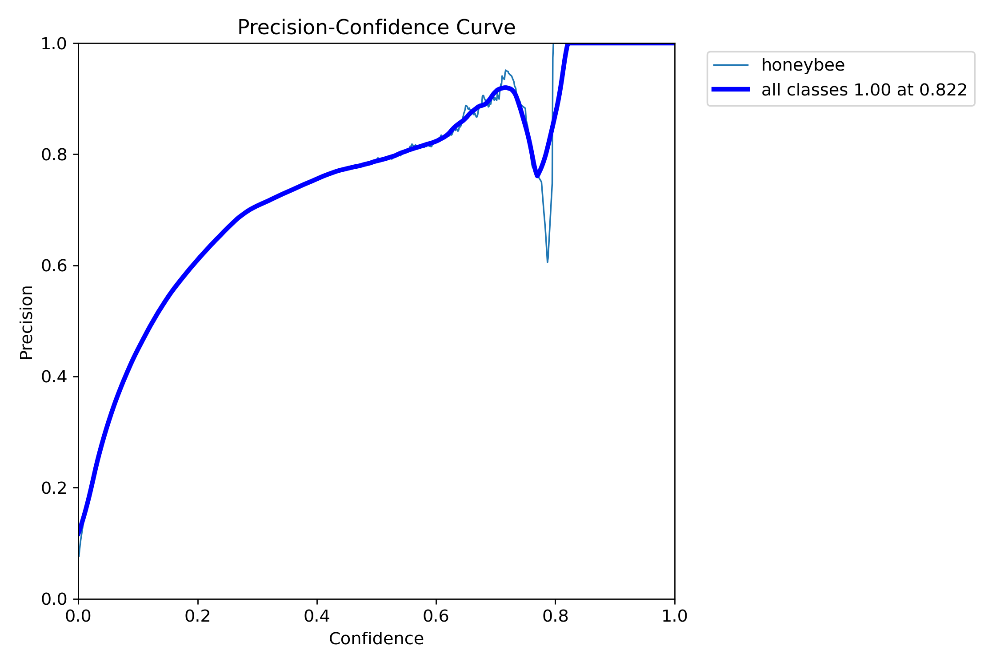

In [ ]:
Image("/content/runs/detect/train/P_curve.png", width=600)

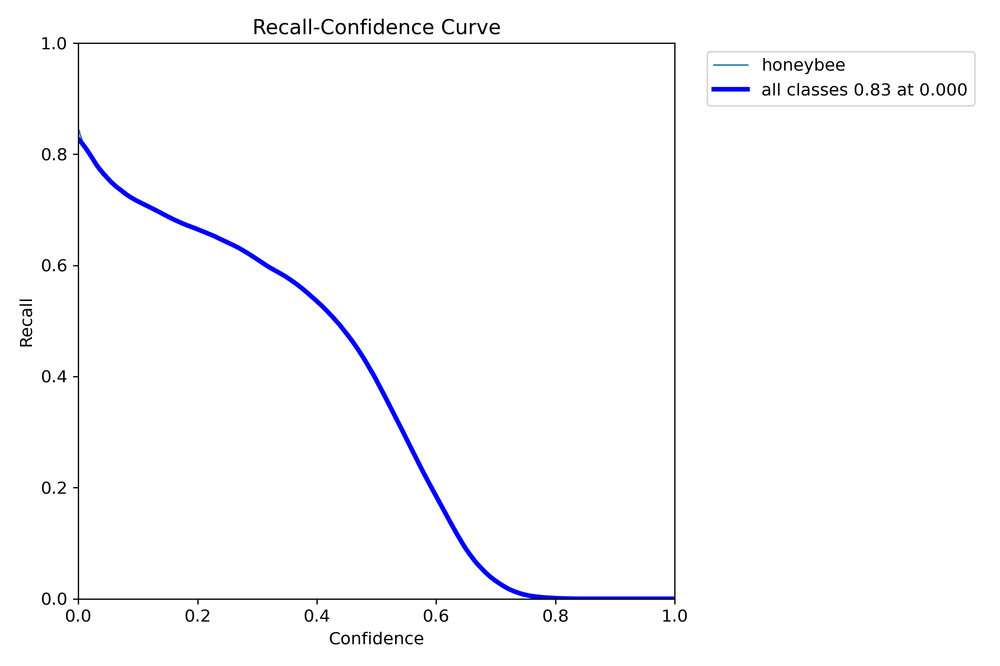

In [ ]:
Image("/content/runs/detect/train/R_curve.png", width=600)

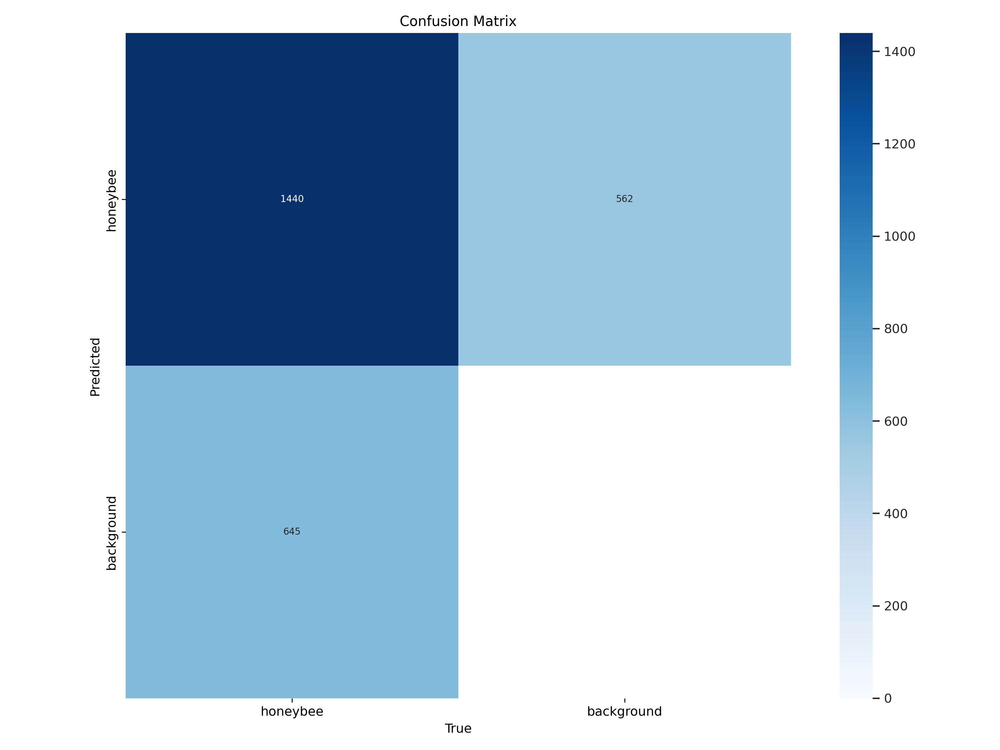

In [ ]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)

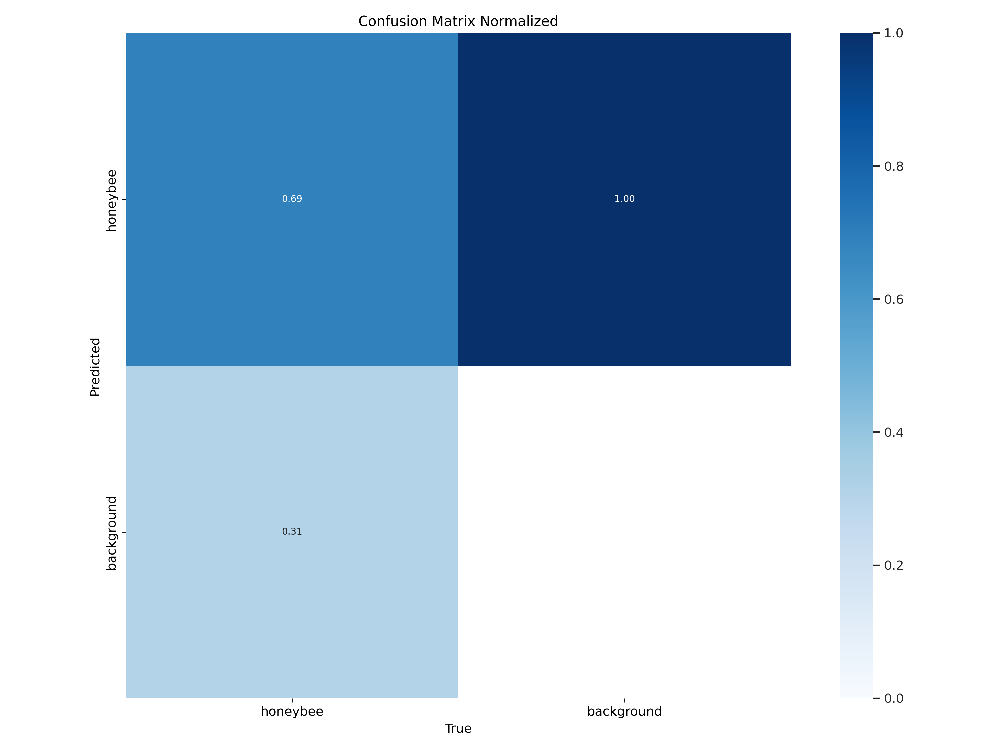

In [ ]:
Image("/content/runs/detect/train/confusion_matrix_normalized.png", width=600)

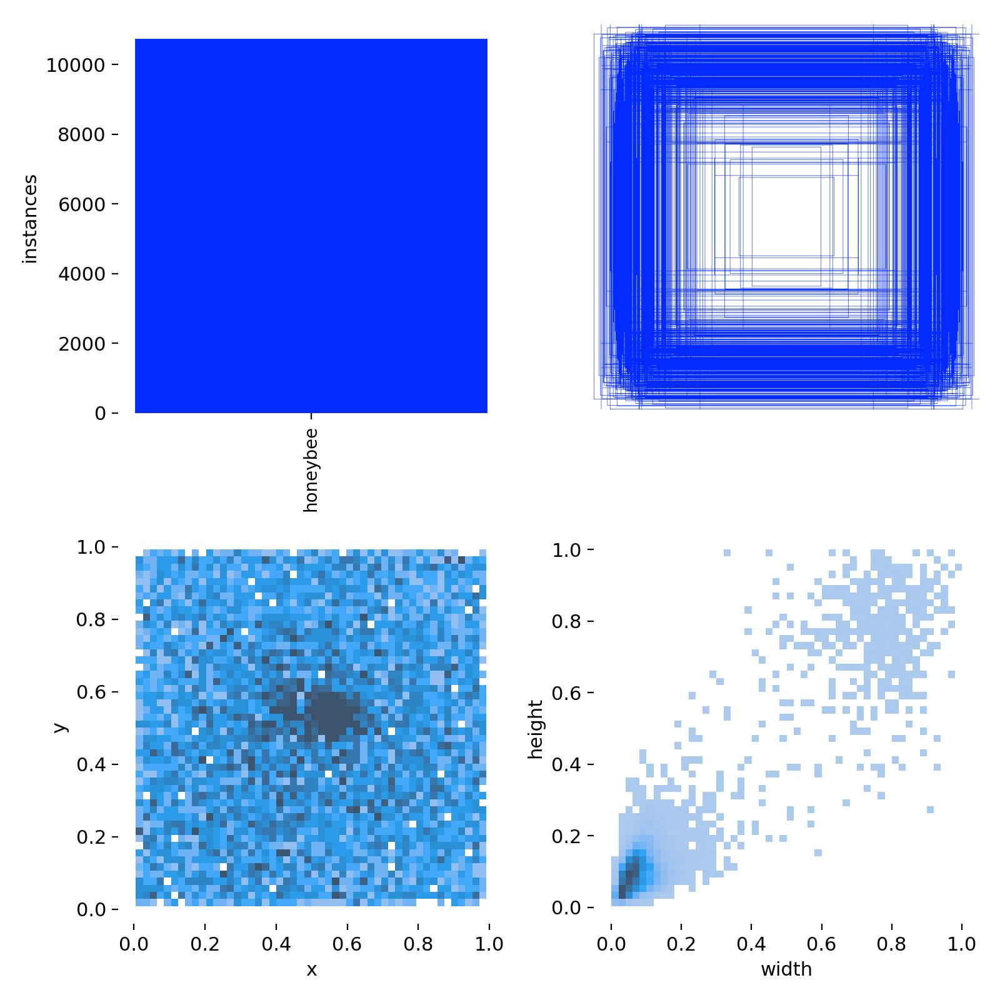

In [ ]:
Image("/content/runs/detect/train/labels.jpg", width=600)

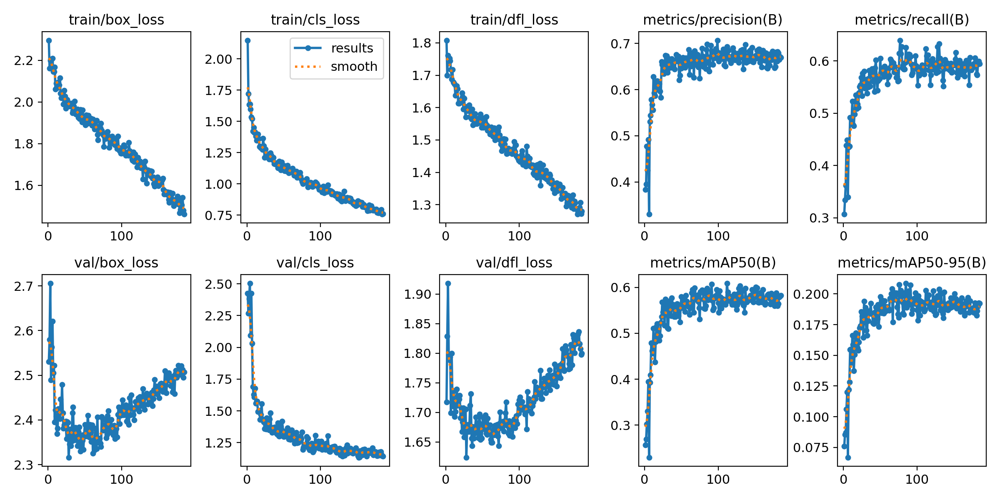

In [ ]:
Image("/content/runs/detect/train/results.png", width=600)

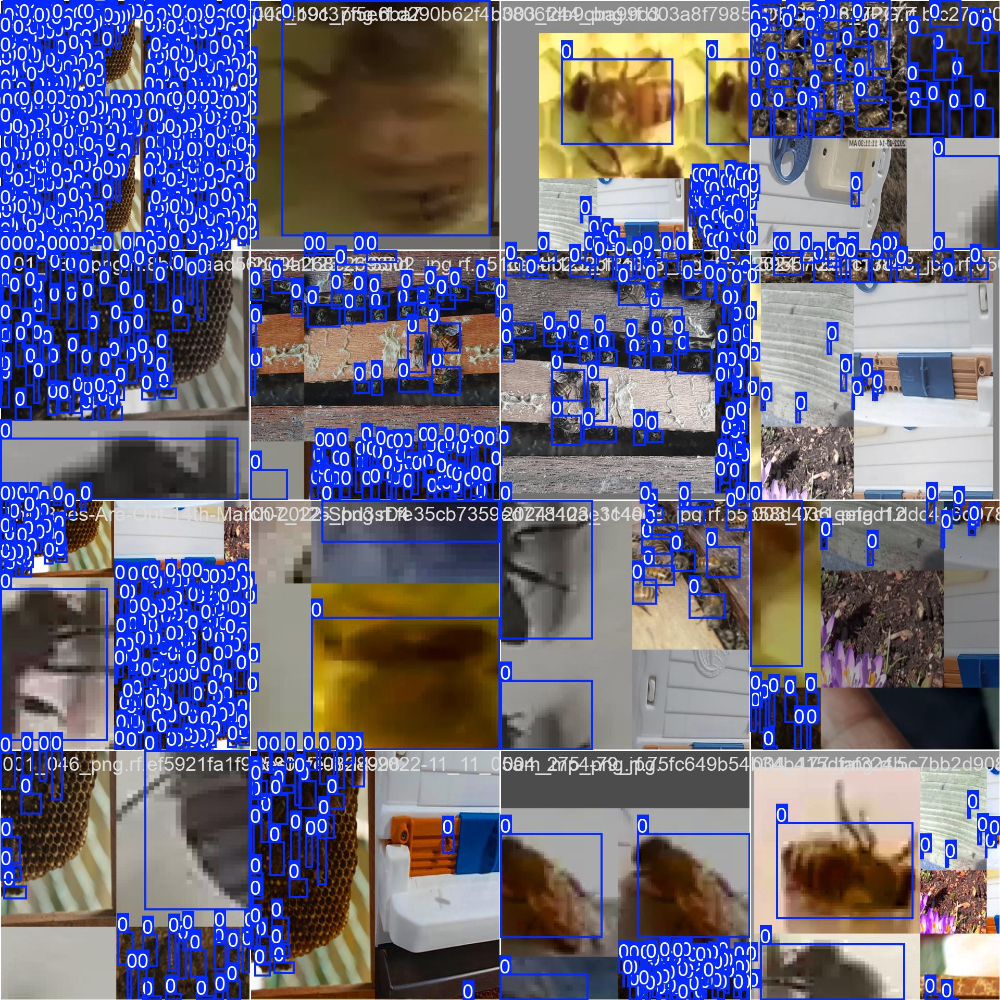

In [ ]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

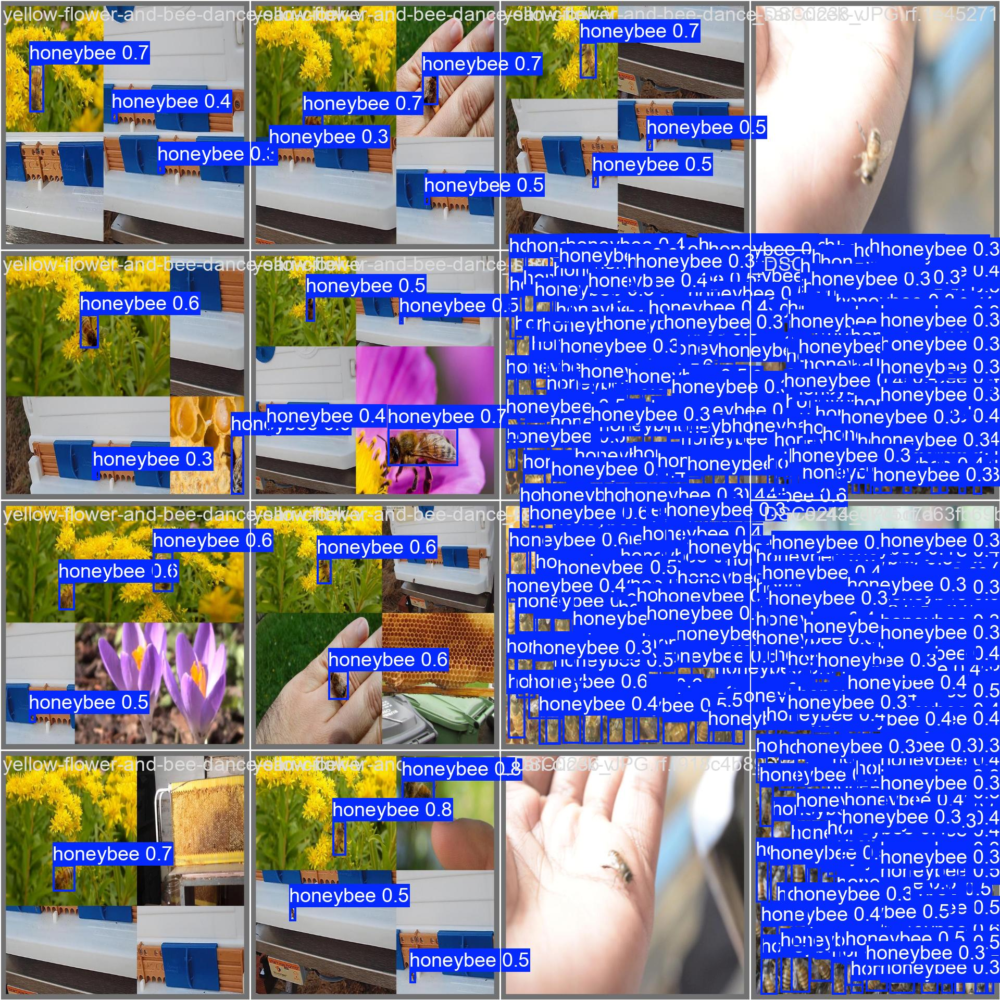

In [ ]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

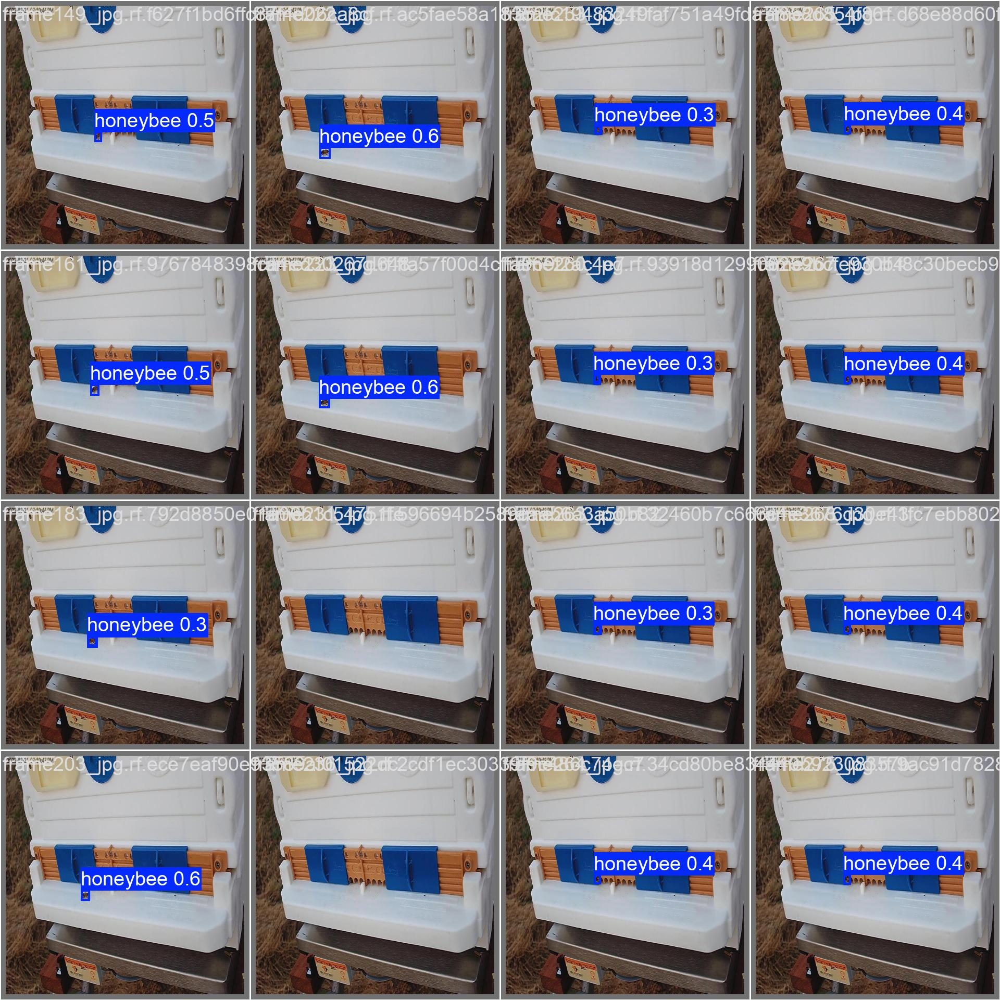

In [ ]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=600)

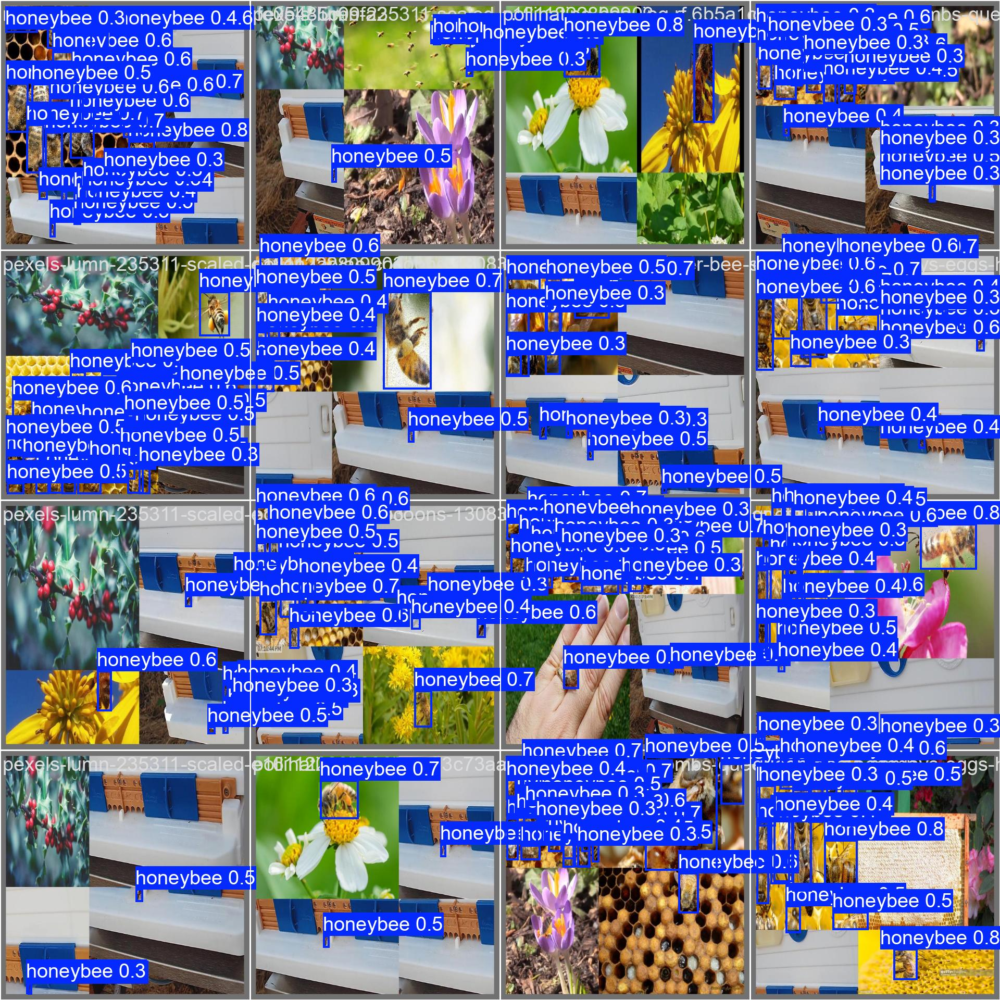

In [ ]:
Image("/content/runs/detect/train/val_batch2_pred.jpg", width=600)

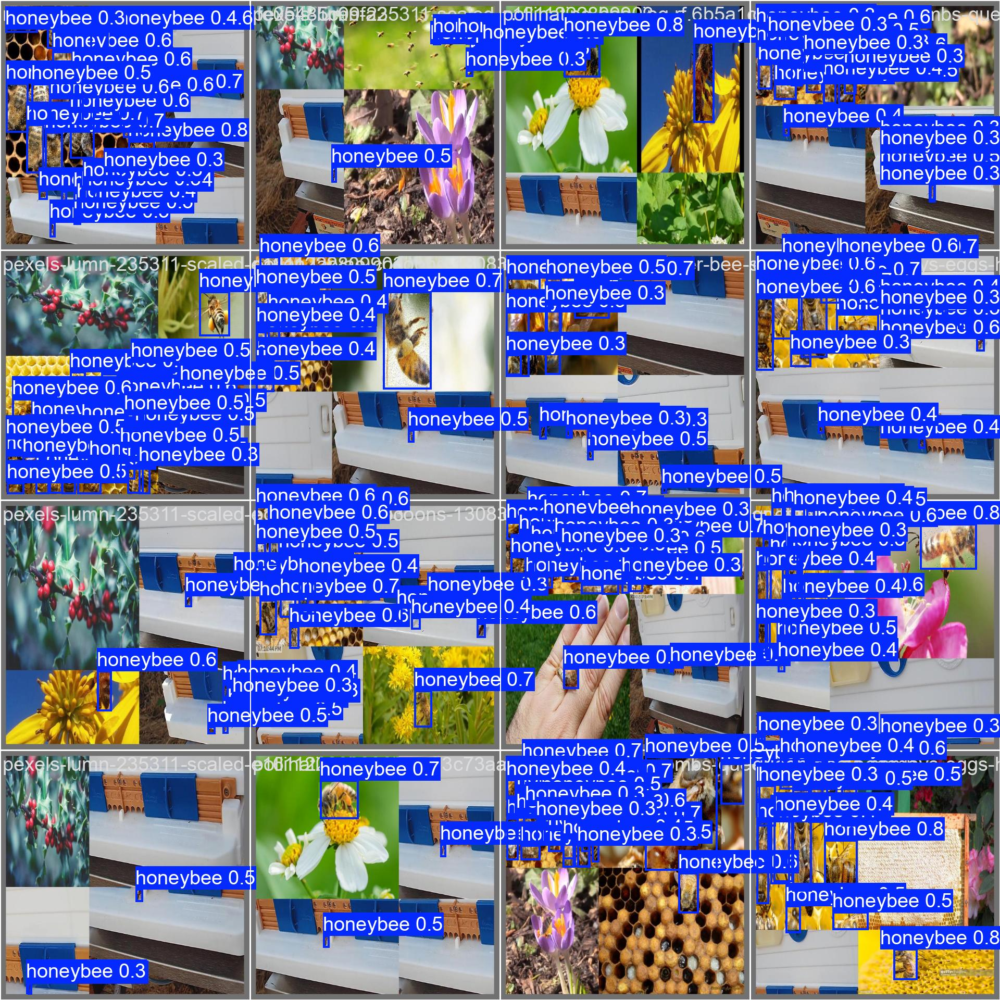

In [ ]:
Image("/content/runs/detect/train/val_batch2_pred.jpg", width=1000)


image 1/1 /content/Counting-Honeybees-4/valid/images/frame13_jpg.rf.f0e82dfb937bdbed5ba0df1626e34a01.jpg: 640x640 (no detections), 16.2ms
Speed: 2.7ms preprocess, 16.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Number of detected honeybees: 0


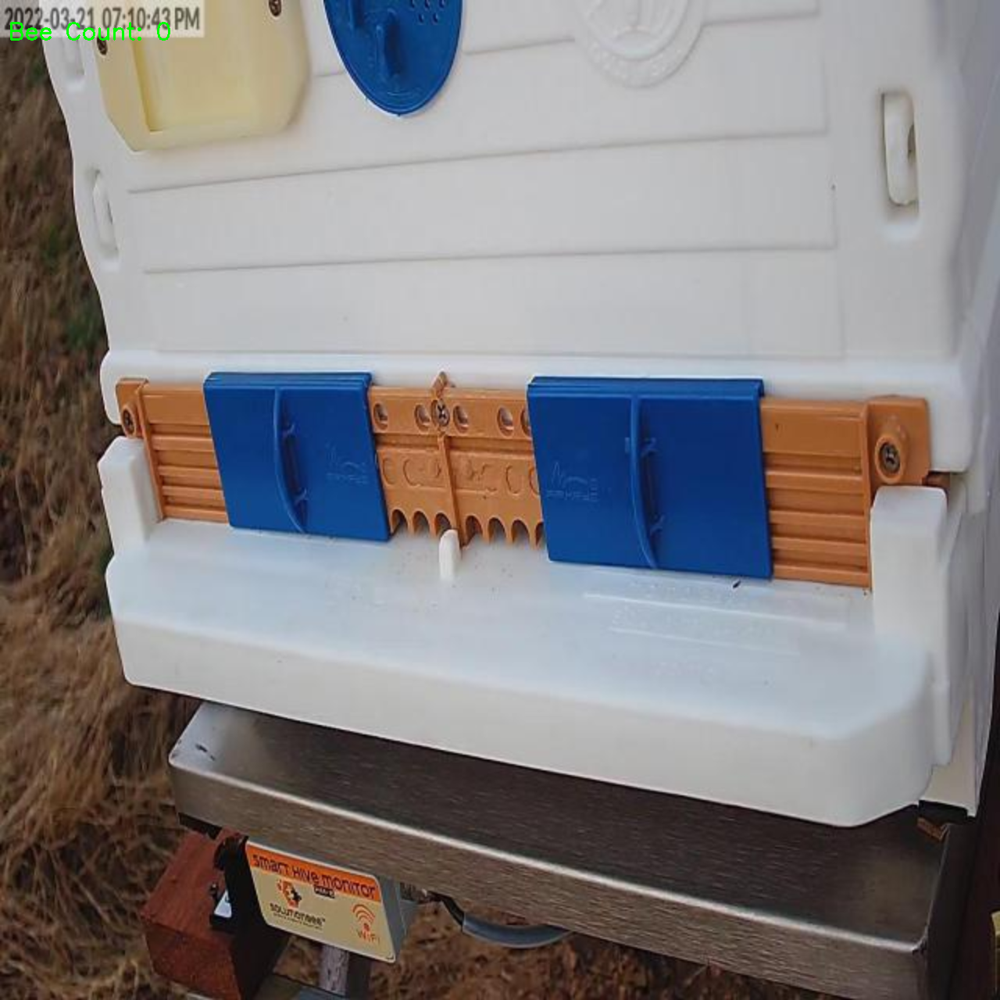

In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow  # Import cv2_imshow for Colab

# Step 1: Load the Trained Model
model = YOLO("/content/runs/detect/train/weights/best.pt")  # Load the trained YOLO model (best.pt)

# Step 2: Load an Image
image_path = "/content/Counting-Honeybees-4/valid/images/frame13_jpg.rf.f0e82dfb937bdbed5ba0df1626e34a01.jpg"  # Path to the image you want to analyze
image = cv2.imread(image_path)

# Step 3: Run Inference
results = model.predict(source=image_path, conf=0.25, show=False)  # Run inference

# Step 4: Extract Detections
detections = results[0]  # First image's results
bee_count = 0

# Filter detections for the "honeybee" class (assuming class=0 is honeybee)
for box in detections.boxes:
    class_id = int(box.cls[0])  # Get class ID
    if class_id == 0:  # Replace with the correct class ID for "honeybee"
        bee_count += 1

print(f"Number of detected honeybees: {bee_count}")

# Step 5: Visualize Results
# Draw bounding boxes on the image
annotated_image = results[0].plot()  # Automatically adds bounding boxes to the image

# Resize the annotated image
resize_scale = 2  # Change this scale factor as needed
new_width = int(annotated_image.shape[1] * resize_scale)
new_height = int(annotated_image.shape[0] * resize_scale)
resized_image = cv2.resize(annotated_image, (new_width, new_height))

# Add text showing the bee count
cv2.putText(resized_image, f"Bee Count: {bee_count}", (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

# Show the resized image
cv2_imshow(resized_image)  # Use cv2_imshow for Colab

# Optional: Save the resized image if needed
cv2.imwrite("output_resized.jpeg", resized_image)

cv2.waitKey(0)
cv2.destroyAllWindows()


image 1/1 /content/honeybee.jpeg: 480x640 6 honeybees, 13.8ms
Speed: 2.3ms preprocess, 13.8ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Number of detected honeybees: 6


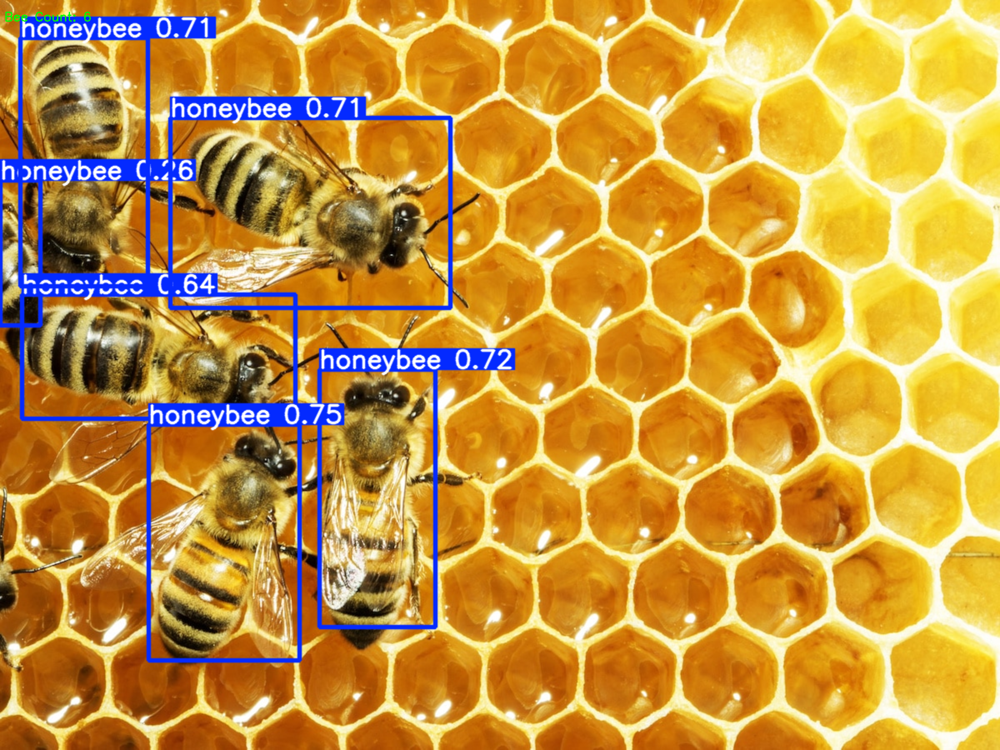

In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow  # Import cv2_imshow for Colab

# Step 1: Load the Trained Model
model = YOLO("/content/runs/detect/train/weights/best.pt")  # Load the trained YOLO model (best.pt)

# Step 2: Load an Image
image_path = "/content/honeybee.jpeg"  # Path to the image you want to analyze
image = cv2.imread(image_path)

# Step 3: Run Inference
results = model.predict(source=image_path, conf=0.25, show=False)  # Run inference

# Step 4: Extract Detections
detections = results[0]  # First image's results
bee_count = 0

# Filter detections for the "honeybee" class (assuming class=0 is honeybee)
for box in detections.boxes:
    class_id = int(box.cls[0])  # Get class ID
    if class_id == 0:  # Replace with the correct class ID for "honeybee"
        bee_count += 1

print(f"Number of detected honeybees: {bee_count}")

# Step 5: Visualize Results
# Draw bounding boxes on the image
annotated_image = results[0].plot()  # Automatically adds bounding boxes to the image

# Resize the annotated image
resize_scale = 2  # Change this scale factor as needed
new_width = int(annotated_image.shape[1] * resize_scale)
new_height = int(annotated_image.shape[0] * resize_scale)
resized_image = cv2.resize(annotated_image, (new_width, new_height))

# Add text showing the bee count
cv2.putText(resized_image, f"Bee Count: {bee_count}", (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

# Show the resized image
cv2_imshow(resized_image)  # Use cv2_imshow for Colab

# Optional: Save the resized image if needed
cv2.imwrite("output_resized.jpeg", resized_image)

cv2.waitKey(0)
cv2.destroyAllWindows()